### Preprocessing of predictions and determination of interface mutations

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

# load dictionaries to improve formatting of model names
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

# load the predictions and split them into dataframes
db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

<Axes: >

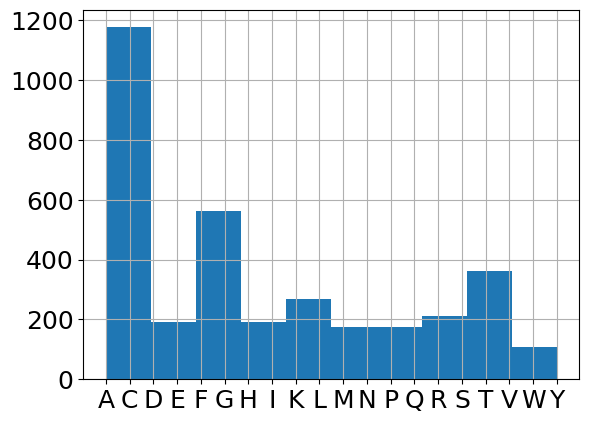

In [2]:
db.sort_values('mutation')['mutation'].hist()

Original unique mutations: 3421
['esmif_monomer_dir', 'msa_1_dir', 'msa_2_dir', 'msa_3_dir', 'msa_4_dir', 'msa_5_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'mutcomputex_dir', 'stability-oracle_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'esmif_multimer_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'mif_dir', 'mifst_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'esm1v_1_dir', 'esm1v_2_dir', 'esm1v_3_dir', 'esm1v_4_dir', 'esm1v_5_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'ankh_dir', 'tranception_dir', 'korpm_dir', 'tranception_weights_dir', 'cartesian_ddg_dir']
['K1566_pslm_rfa_1_dir', 'K1566_pslm_rfa_2_dir', 'K1566_pslm_rfa_3_dir', 'K1566_pslm_rfa_4_dir', 'K1566_pslm_rfa_5_dir', 'K1566_pslm_rfa_6_dir', 'K1566_pslm_rfa_7_dir', 'K1566_pslm_rfa_8_dir', 'K1566_pslm_rfa_9_dir', 'K1566_pslm_rfa_10_dir', 'K1566_pslm_rfa_11_dir']
['esmif_monomer_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'mutcomputex_dir', 'stability-oracle_dir', 'esm2_3B_dir', 

,,esmif_monomer_dir,msa_1_dir,msa_2_dir,msa_3_dir,msa_4_dir,msa_5_dir,msa_transformer_median_dir,msa_transformer_mean_dir,mutcomputex_dir,stability-oracle_dir,...,K1566_pslm_rfa_7_dir,K1566_pslm_rfa_8_dir,K1566_pslm_rfa_9_dir,K1566_pslm_rfa_10_dir,K1566_pslm_rfa_11_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,-0.043712,-9.003407,-8.570910,-8.138058,-7.828304,-8.771099,-8.570910,-8.462356,-0.010359,-0.420,...,-0.631644,-0.635816,-0.635816,-0.635816,-0.593140,-1.80,63,0.509908,-1.005275,-1.80
1A23_32L,1A23_32L,-0.042389,-8.228857,-7.639166,-7.996706,-7.244612,-7.631312,-7.639166,-7.748131,0.383801,0.528,...,0.448606,0.434181,0.434181,0.434181,0.473899,4.95,63,4.100409,-1.491664,4.95
1A23_32S,1A23_32S,-0.029983,-6.820486,-5.639109,-4.841201,-4.271751,-5.161361,-5.161361,-5.346782,-0.003409,-0.170,...,-0.363571,-0.368064,-0.368064,-0.368064,-0.353730,4.40,63,-1.339595,-1.366514,4.40
1A23_32Y,1A23_32Y,-0.020219,-4.798388,-4.519424,-3.944585,-4.510036,-3.452652,-4.510036,-4.245017,0.060203,0.732,...,0.629617,0.623211,0.623211,0.623211,0.661942,4.63,63,1.416091,-1.967841,4.63
1A23_33S,1A23_33S,-0.024960,-8.154238,-6.983203,-7.309464,-6.575727,-7.499977,-7.309464,-7.304522,-0.327936,-1.156,...,-0.839226,-0.846686,-0.846686,-0.846686,-0.815217,-1.10,63,0.489207,-0.829679,-1.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.037373,-3.120034,-0.158593,-0.096729,-0.498763,-0.298061,-0.298061,-0.834436,0.002285,0.628,...,0.661812,0.671593,0.671593,0.671593,0.670624,1.10,17,2.534977,0.008551,1.10
5CRO_26Q,5CRO_26Q,-0.004605,-2.316929,1.459888,1.633560,1.360325,1.471579,1.459888,0.721684,0.013478,0.921,...,0.247456,0.267579,0.267579,0.267579,0.261379,1.40,17,2.969375,-1.197152,1.40
5CRO_26V,5CRO_26V,0.037691,-2.944973,1.036326,0.091582,0.751292,0.919195,0.751292,-0.029315,0.043387,0.513,...,0.775492,0.800252,0.800252,0.800252,0.774120,0.90,17,2.064658,-0.518177,0.90


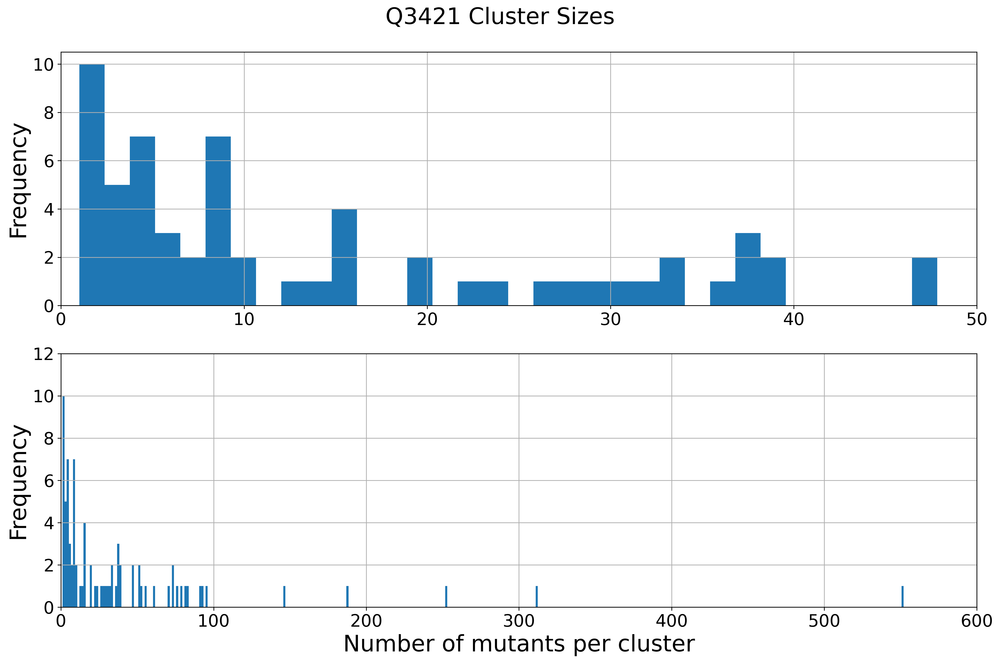

In [3]:
db_class = db

print('Original unique mutations:', len(db_class))

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))#, 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
print(original_pred_cols)

ensemble_cols = [c for c in db_class.columns if 'pslm' in c]
print(ensemble_cols)

db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

print(original_pred_cols_reduced)

db_class = db_class[original_pred_cols + ensemble_cols + ['ddG', 'cluster']]

#db_class_rescaled = db_class.copy(deep=True)
#db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=db['ddG'].mean(), size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']

#db_class = db_class.drop([c+'_dir' for c in ['ACDCNND', 'FoldXD', 'DDGunD', 'CartddgD']], axis=1) #'PopMsD', 'TNetD'

print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50]) 
axes[0].tick_params(axis='x', labelsize=18) 
axes[0].set_ylabel('Frequency', fontsize=24)  

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 600]) 
axes[1].set_ylim([0, 12])  
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('Q3421 Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

db_class

In [4]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

20 61


### Non-bootstrapped Analysis of Q3421 (not in text)

In [5]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class[original_pred_cols_reduced + ensemble_cols + ['cluster', 'ddG', 'mpnn_rosetta_dir']], 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
summ.to_csv('../data/extended/q3421_extended.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF_mean', 'Clustered Ensemble', 'Ensemble_2', 'ProteinMPNN 0.1', 'MIF-ST', 'KORPM', 'MSA-T mean', 'MSA-T 1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label', 'Rosetta/ProtMPNN', 'Stability Oracle', 'MutComputeX',
    'Ensemble 5 Feats', 'Ensemble 6 Feats', 'Ensemble 7 Feats'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# < 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp1 = summ.reset_index()
#tmp1.to_csv('../data/extended/q3421_extended_bootstrapped.csv')

# ~ 10 minutes for 100 bootstraps

mpnn_rosetta
stability-oracle
cartesian_ddg
mpnn_20_00
korpm
esm2_650M
random


AUPRC Spearman's ρ Net Stabilization   MCC  \
Model Type   Model                                                              
unknown      ΔΔG label              1.00         1.00         800 ± 116  1.00   
structural   Rosetta/ProtMPNN       0.53         0.62        143 ± 46.7  0.34   
transfer     Stability Oracle       0.49         0.58      -38.5 ± 78.6  0.35   
biophysical  Rosetta CartDDG        0.47         0.56       14.0 ± 76.1  0.33   
structural   ProteinMPNN 0.1        0.46         0.48       45.5 ± 43.5  0.30   
             ProteinMPNN 0.2        0.46         0.49       30.1 ± 44.2  0.29   
             ProteinMPNN 0.3        0.45         0.48       5.42 ± 52.9  0.29   
             MIF                    0.43         0.48      -40.5 ± 63.1  0.26   
             ESM-IF                 0.43         0.45       20.4 ± 48.5  0.24   
             ESM-IF(M)              0.41         0.43      -34.8 ± 69.6  0.22   
             MutComputeX            0.40         0.36      -34.2 ± 40.3  0.21   
potential    KORPM                  0.40         0.47        -273 ± 144  0.25   
structural   MIF-ST                 0.38         0.40      -18.4 ± 59.1  0.22   
evolutionary ESM-2 650M             0.36         0.29      -71.1 ± 56.9  0.20   
             Ankh                   0.35         0.32      -15.0 ± 37.4  0.17   
             MSA-T mean             0.34         0.28      -46.8 ± 36.7  0.16   
             ESM-2 150M             0.34         0.22        -394 ± 173  0.15   
             MSA-T median           0.34         0.28      -27.4 ± 37.0  0.17   
             ESM-1V mean            0.34         0.22       -208 ± 91.6  0.15   
             ESM-1V median          0.33         0.22       -230 ± 99.0  0.15   
             Tranception            0.33         0.27       37.4 ± 22.0  0.16   
             ESM-2 3B               0.33         0.26      -32.8 ± 44.5  0.17   
             ESM-2 15B              0.33         0.26      -5.00 ± 35.0  0.16   
             Tranception (reduced)  0.33         0.26       12.3 ± 16.9  0.15   
unknown      Gaussian Noise         0.23         0.01        -487 ± 141  0.01   
NaN          Avg. Dev.              0.03         0.04             64.9   0.03   

                                   Sensitivity Recall @ k1   MRR  
Model Type   Model                                                
unknown      ΔΔG label                    1.00        1.00  1.00  
structural   Rosetta/ProtMPNN             0.35        0.31  0.45  
transfer     Stability Oracle             0.50        0.31  0.44  
biophysical  Rosetta CartDDG              0.45        0.29  0.42  
structural   ProteinMPNN 0.1              0.32        0.24  0.44  
             ProteinMPNN 0.2              0.34        0.24  0.44  
             ProteinMPNN 0.3              0.35        0.24  0.44  
             MIF                          0.34        0.23  0.43  
             ESM-IF                       0.26        0.20  0.39  
             ESM-IF(M)                    0.26        0.20  0.39  
             MutComputeX                  0.20        0.15  0.37  
potential    KORPM                        0.46        0.24  0.38  
structural   MIF-ST                       0.22        0.22  0.34  
evolutionary ESM-2 650M                   0.23        0.20  0.36  
             Ankh                         0.17        0.18  0.37  
             MSA-T mean                   0.16        0.15  0.34  
             ESM-2 150M                   0.31        0.20  0.40  
             MSA-T median                 0.16        0.16  0.33  
             ESM-1V mean                  0.24        0.17  0.31  
             ESM-1V median                0.24        0.17  0.31  
             Tranception                  0.10        0.16  0.32  
             ESM-2 3B                     0.18        0.14  0.34  
             ESM-2 15B                    0.14        0.15  0.34  
             Tranception (reduced)        0.10        0.16  0.32  
unknown      Gaussian No

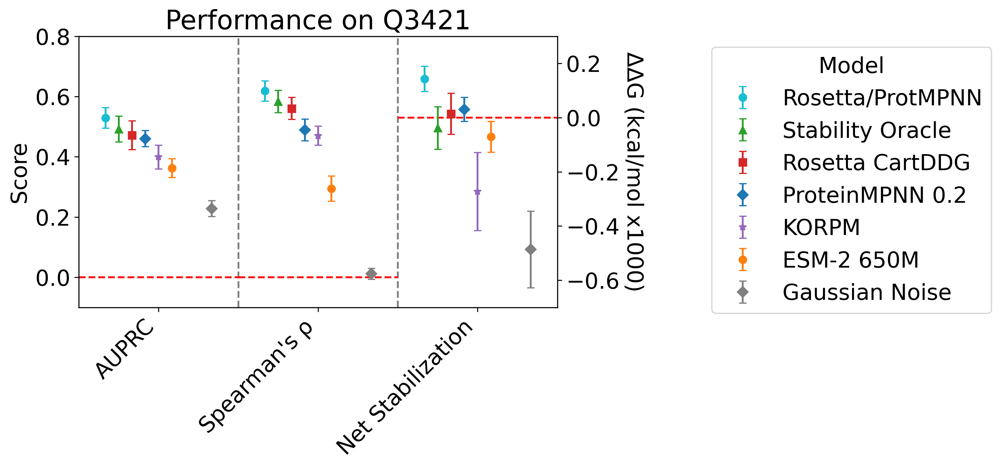

In [ ]:
s2 = tmp1.sort_values('auprc_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)
plot_cols = ['auprc', 'spearman','net_stabilization']
plot_models = ['mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'Q3421'
y_lim = (-0.1, 0.8)
right_y_lim = (-.700, .300)
table_cols = ['auprc', 'spearman','net_stabilization', 'MCC', 'sensitivity', 'recall@k1.0', 'mean_reciprocal_rank']
saveloc = '../data/extended/q3421_extended_bootstrapped_formatted.csv'
analysis_utils.bootstrap_table(s3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['net_stabilization'], #table_cols, 
                sort_col='auprc',
                saveloc=saveloc)

In [ ]:
#summ2 = analysis_utils.compute_stats(db_class[original_pred_cols_reduced + ensemble_cols + ['cluster', 'ddG', 'mpnn_rosetta_dir']], 
#                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
#                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

cartesian_ddg_dir
esm2_650M_dir
korpm_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
ddG_dir
random_dir


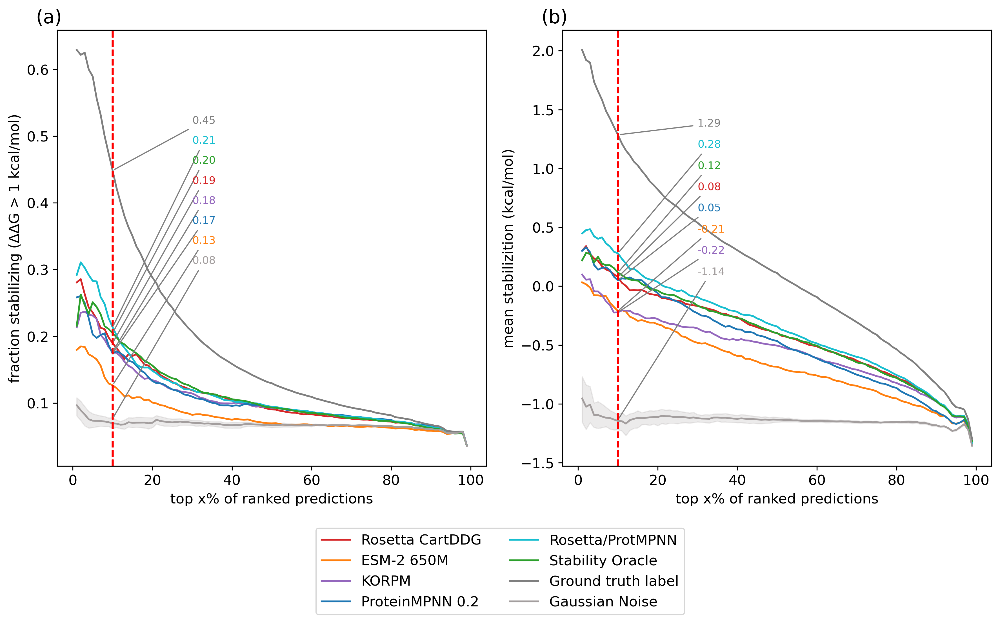

In [ ]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))
class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])
crn

analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'stability-oracle_dir', 'ddG_dir', 'random_dir'], spacing=0.06, measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 
# < 4 minutes

### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

ankh_dir
esm2_650M_dir
msa_transformer_mean_dir
tranception_weights_dir
esmif_multimer_dir
mif_dir
mpnn_20_00_dir
mutcomputex_dir
ddG_dir
random_dir


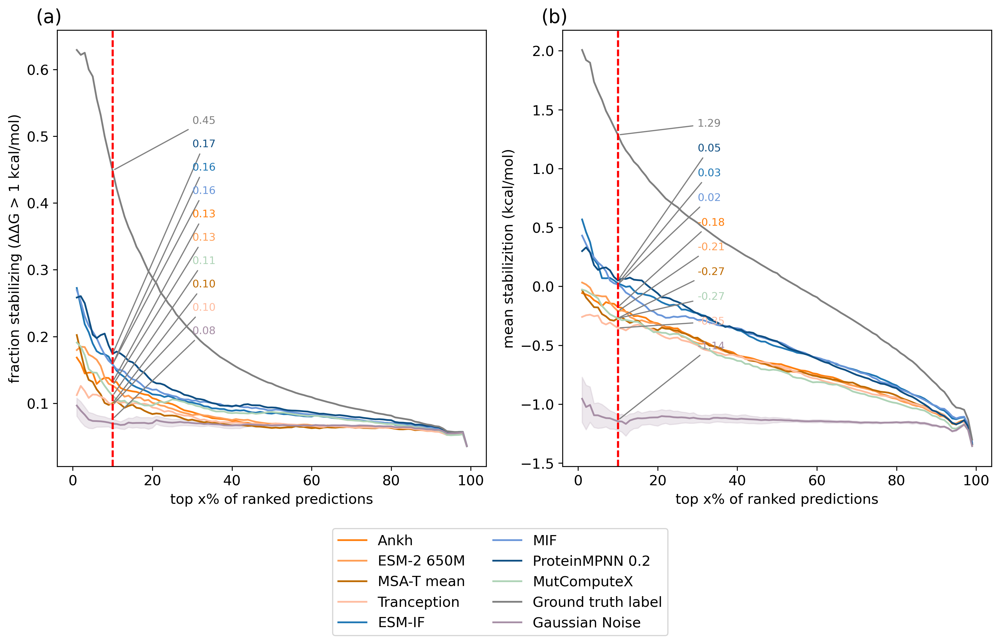

In [ ]:
import importlib
importlib.reload(analysis_utils)
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_weights_dir', 'mutcomputex_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc'])

### Bootstrapped Q3421 Analysis (Used for Figure 1 and Extended Data Table 1)

### Visualization of Prediction Distributions (Supplementary Figure 1)

       cluster         variable     value
13           4  ProteinMPNN 0.2 -2.431013
14           4  ProteinMPNN 0.2 -1.133565
15           4  ProteinMPNN 0.2 -6.312821
16           4  ProteinMPNN 0.2 -5.340909
17           4  ProteinMPNN 0.2 -3.739786
...        ...              ...       ...
10258       17              ΔΔG  1.100000
10259       17              ΔΔG  1.400000
10260       17              ΔΔG  0.900000
10261       17              ΔΔG -0.100000
10262       17              ΔΔG  0.400000

[2658 rows x 3 columns]


<Axes: xlabel='cluster', ylabel='value'>

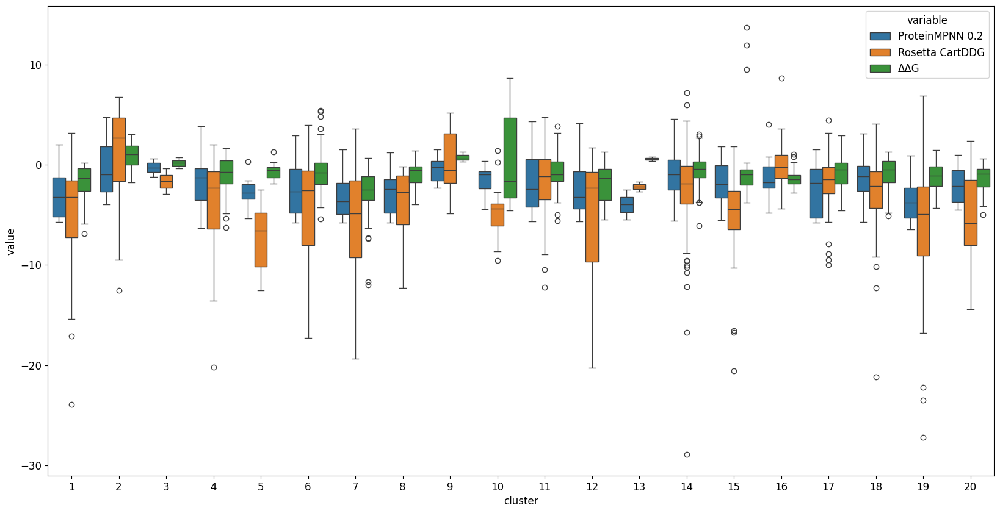

In [ ]:
db_plot = db_class.copy(deep=True)
db_plot = db_plot.loc[~db_plot['ddG_dir'].isna()]
db_plot = db_plot.rename({'ddG_dir': 'ΔΔG', 'mpnn_20_00_dir': 'ProteinMPNN 0.2', 'cartesian_ddg_dir': 'Rosetta CartDDG'}, axis=1)
db_plot = db_plot[['cluster', 'ProteinMPNN 0.2', 'Rosetta CartDDG', 'ΔΔG']].melt(id_vars='cluster')
db_plot = db_plot.loc[db_plot['cluster']<21]
print(db_plot)
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(db_plot, x='cluster', y='value', hue='variable', ax=ax)

### Supplementary Table 5

In [ ]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp2 = summ2.reset_index()

# < 15 minutes for 100 bootstraps

mpnn_rosetta
esm2_650M
cartesian_ddg
mpnn_20_00
random
korpm
stability-oracle


MSE Accuracy Spearman's ρ    wρ  \
Model Type   Model                                                            
structural   Rosetta/ProtMPNN       58.8 ± 3.98     0.80         0.62  0.49   
evolutionary ESM-2 15B              52.4 ± 6.73     0.77         0.25  0.25   
             ESM-2 3B               42.8 ± 6.39     0.77         0.26  0.26   
             MSA-T median           38.1 ± 3.57     0.77         0.27  0.23   
             Ankh                   37.7 ± 3.20     0.77         0.31  0.26   
             MSA-T mean             37.5 ± 3.58     0.77         0.28  0.24   
structural   MIF-ST                 34.7 ± 3.10     0.77         0.39  0.32   
evolutionary ESM-2 650M             27.7 ± 3.28     0.76         0.29  0.28   
biophysical  Rosetta CartDDG        26.4 ± 1.92     0.78         0.56  0.43   
evolutionary ESM-1V median          24.9 ± 4.11     0.74         0.20  0.22   
             ESM-1V mean            24.7 ± 4.07     0.74         0.21  0.23   
structural   MIF                    23.6 ± 2.15     0.77         0.47  0.39   
evolutionary ESM-2 150M             16.2 ± 2.30     0.71         0.21  0.26   
structural   ProteinMPNN 0.1        8.36 ± 0.76     0.79         0.47  0.39   
             ProteinMPNN 0.2        7.59 ± 0.72     0.78         0.48  0.40   
             ProteinMPNN 0.3        7.29 ± 0.76     0.78         0.47  0.39   
evolutionary Tranception            5.12 ± 0.51     0.78         0.26  0.24   
             Tranception (reduced)  5.12 ± 0.51     0.78         0.25  0.22   
structural   ESM-IF(M)              5.07 ± 0.50     0.77         0.42  0.37   
             ESM-IF                 5.07 ± 0.50     0.77         0.45  0.40   
unknown      Gaussian Noise         4.94 ± 0.42     0.71         0.01  0.02   
structural   MutComputeX            4.06 ± 0.47     0.78         0.36  0.27   
potential    KORPM                  3.58 ± 0.51     0.73         0.47  0.34   
transfer     Stability Oracle       2.97 ± 0.49     0.78         0.58  0.45   
unknown      ΔΔG label              0.00 ± 0.00     1.00         1.00  1.00   
NaN          Avg. Dev.                    2.11      0.02         0.04  0.03   

                                   Net Stabilization  
Model Type   Model                                    
structural   Rosetta/ProtMPNN                    146  
evolutionary ESM-2 15B                         -7.35  
             ESM-2 3B                          -31.1  
             MSA-T median                      -27.0  
             Ankh                              -16.2  
             MSA-T mean                        -45.9  
structural   MIF-ST                            -15.4  
evolutionary ESM-2 650M                        -70.6  
biophysical  Rosetta CartDDG                    25.8  
evolutionary ESM-1V median                      -225  
             ESM-1V mean                        -203  
structural   MIF                               -29.9  
evolutionary ESM-2 150M                         -377  
structural   ProteinMPNN 0.1                    45.4  
             ProteinMPNN 0.2                    29.7  
             ProteinMPNN 0.3                    3.21  
evolutionary Tranception                        31.2  
             Tranception (reduced)              8.37  
structural   ESM-IF(M)                         -26.6  
             ESM-IF                             22.6  
unknown      Gaussian Noise                     -466  
structural   MutComputeX                       -31.6  
potential    KORPM                              -241  
transfer     Stability Oracle                  -24.2  
unknown      ΔΔG label                           784  
NaN          Avg. Dev.                          70.5

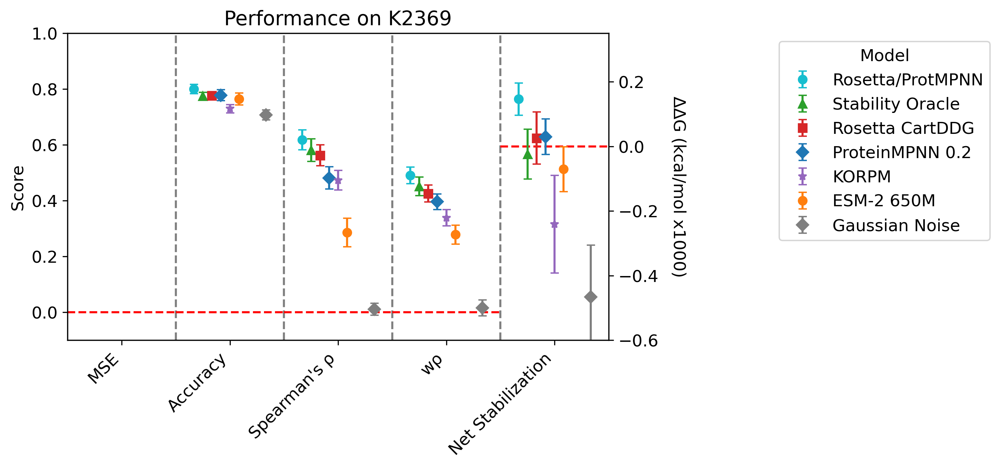

In [ ]:
importlib.reload(analysis_utils)
s2 = tmp2.sort_values('mean_squared_error_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)
plot_cols = ['mean_squared_error', 'accuracy', 'spearman', 'weighted_spearman', 'net_stabilization']
plot_models = ['mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'K2369'
y_lim = (-0.1, 1)
right_y_lim = (-.600, .350)
table_cols = ['mean_squared_error', 'accuracy', 'spearman', 'weighted_spearman', 'net_stabilization']
analysis_utils.bootstrap_table(s3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['mean_squared_error'],
                sort_col='mean_squared_error',
                )

In [ ]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k',
    'mean_squared_error': 'MSE'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = summ2.sort_values('mean_squared_error_mean', ascending=True).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir'])].drop('measurement', axis=1)
s4 = s3[['model_type', 'model', 'n_mean', 'n_std',
    'mean_squared_error_mean', 'mean_squared_error_std',
    'accuracy_mean', 'accuracy_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
vis = s5.copy()

# Iterate over the DataFrame and update the mean columns
stdev_cols = ['MSE mean', 'Net Stabilization mean']
for column in s5.columns:
    if 'mean' in column and column in stdev_cols:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(2).astype(str) + ' ± ' + s5[stdev_column].round(1).astype(str)
    elif 'mean' in column:
        s5[column] = s5[column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s7 = s6.drop('n', axis=1).set_index(['Model Type', 'Model'])
s7.to_csv('../data/extended/q3421_extended_bootstrapped_other_stats.csv', encoding='utf-8-sig')

for column in vis.columns:
    if 'mean' in column: # and column in stdev_cols:
        stdev_column = column.replace('mean', 'stdev')
        vis[column] = vis[column].round(2).astype(str) + ' ± ' + vis[stdev_column].round(2).astype(str)
vis = vis[[col for col in vis.columns if 'stdev' not in col]]
vis.columns = [col[:-5] for col in vis.columns]
vis = vis.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)

vis

,Model Type,Model,n,MSE,Accuracy,Spearman's ρ,wρ,Net Stabilization
0,unknown,ΔΔG label,3384.22 ± 714.74,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,783.58 ± 120.78
1,transfer,Stability Oracle,3364.41 ± 715.61,2.97 ± 0.49,0.78 ± 0.01,0.58 ± 0.04,0.45 ± 0.03,-24.2 ± 76.97
2,potential,KORPM,3384.22 ± 714.74,3.58 ± 0.51,0.73 ± 0.01,0.47 ± 0.04,0.34 ± 0.03,-241.04 ± 151.31
3,structural,MutComputeX,3372.1 ± 715.52,4.06 ± 0.47,0.78 ± 0.02,0.36 ± 0.04,0.27 ± 0.03,-31.61 ± 42.25
4,unknown,Gaussian Noise,3384.22 ± 714.74,4.94 ± 0.42,0.71 ± 0.02,0.01 ± 0.02,0.02 ± 0.03,-465.98 ± 160.59
5,structural,ESM-IF,3381.22 ± 715.14,5.07 ± 0.5,0.77 ± 0.02,0.45 ± 0.04,0.4 ± 0.03,22.62 ± 48.63
6,structural,ESM-IF(M),3384.22 ± 714.74,5.07 ± 0.5,0.77 ± 0.02,0.42 ± 0.05,0.37 ± 0.03,-26.61 ± 67.61
7,evolutionary,Tranception (reduced),3384.22 ± 714.74,5.12 ± 0.51,0.78 ± 0.03,0.25 ± 0.04,0.22 ± 0.04,8.37 ± 20.55
8,evolutionary,Tranception,3384.22 ± 714.74,5.12 ± 0.51,0.78 ± 0.02,0.26 ± 0.04,0.24 ± 0.04,31.2 ± 23.69
9,structural,ProteinMPNN 0.3,3384.22 ± 714.74,7.29 ± 0.76,0.78 ± 0.02,0.47 ± 0.04,0.39 ± 0.03,3.21 ± 57.51


### Figure 1

In [ ]:
db_new = pd.read_csv('~/PSLMs/data/inference/tranception_results.csv', index_col=0)
db_new = db_new.rename({'tranception_weights_dir': 'tranception_new_dir', 'runtime_tranception_weights_dir': 'runtime_tranception_new_dir'}, axis=1)
db['uid3'] = db['code'] + '_' + (db['position']-db['offset_up']).astype(str) + db['mutation']
db_new = db.reset_index().set_index('uid3').join(db_new).reset_index().set_index('uid')
db_new[['tranception_new_dir']]

,tranception_new_dir
uid,
1A23_30S,-0.109360
1A23_32L,-0.059789
1A23_32S,-0.032388
1A23_32Y,-0.039155
1A23_33S,-0.075979
...,...
5CRO_26L,-0.105731
5CRO_26Q,-0.045138
5CRO_26V,-0.045453


### Additional Figure describing correlation between predictions and scores of two selected models

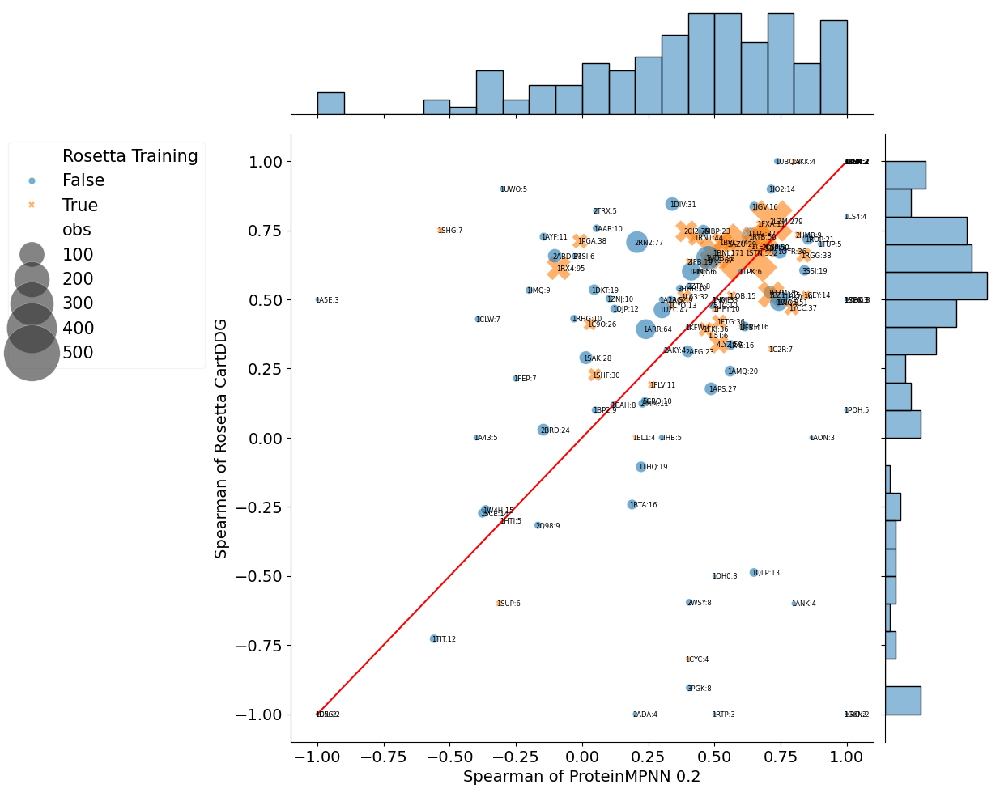

In [ ]:
importlib.reload(analysis_utils)

col = 'Rosetta Training'
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2[col] = db['overlaps_seq_rosetta']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
_ = analysis_utils.correlations(db_class_2, None, stat='spearman', marker_name=col,
    score_name='cartesian_ddg_dir', score_name_2='mpnn_20_00_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)

### Figure 4 a&b

KeyError: "['K1566_pslm_rfa_7_dir'] not in index"

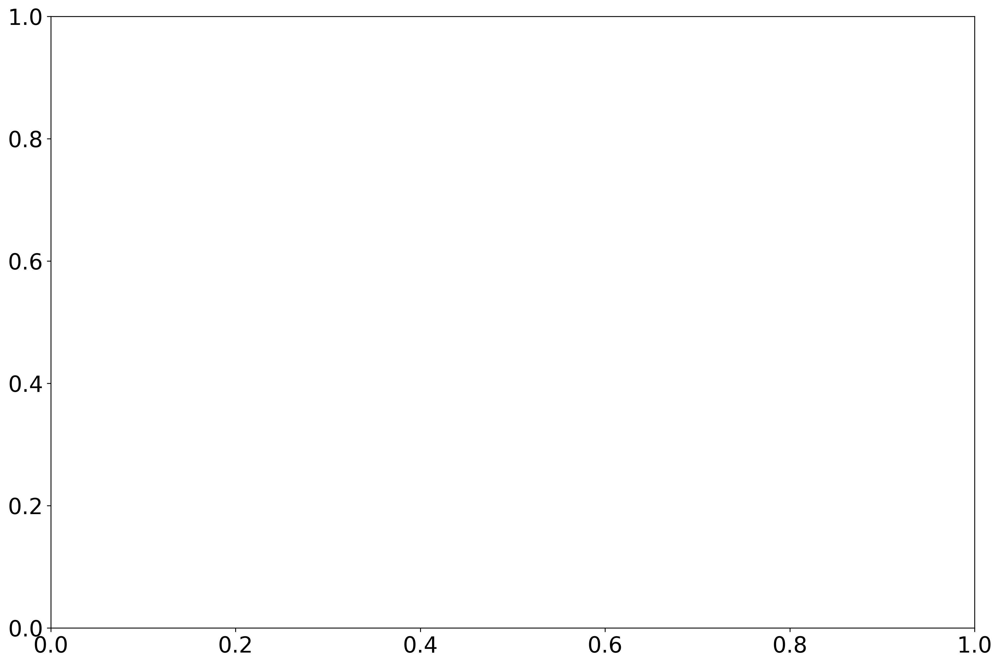

In [ ]:
subset = ['K1566_pslm_rfa_7_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'esm2_650M_dir',
            #'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_rosetta_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            #'mif_dir',
            'mifst_dir',
            'mutcomputex_dir',
            'stability-oracle_dir',
            'random_dir',
            'ddG_dir']
db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d, model_order = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'top',
                        drop_label = True,
                        )  
# < 10 seconds

(0.0, 50.0)

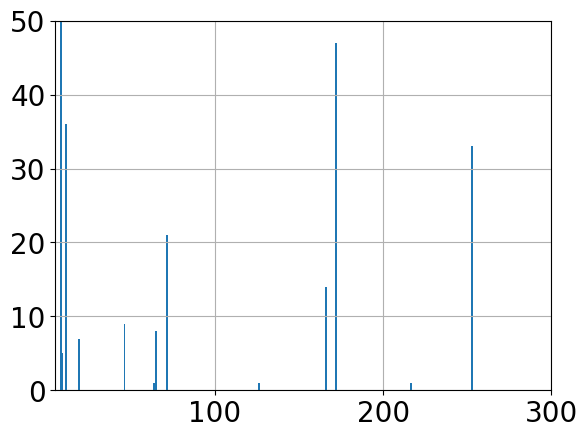

In [ ]:
db_complete.loc[db_complete['neff'] < 1000, 'neff'].hist(bins=1000)
plt.xlim(5,300)
plt.ylim(0,50)

### Figure 4 c&d

In [ ]:
db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
            
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        split_col_2 = 'conservation', 
                        threshold_1 = 10,
                        threshold_2 = 75, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        order=model_order,
                        plots='top',
                        drop_label = True,
                        split_last = False
                        # scaffold order is col1 & col2 > T, col1 < T & col2 > T, col1 > T and col2 < T, col1 & col2 < T
                        )

NameError: name 'model_order' is not defined

  0%|          | 0/1000 [00:00<?, ?it/s]

class
neff <= 300     304
neff > 300     1855
Name: n, dtype: int64


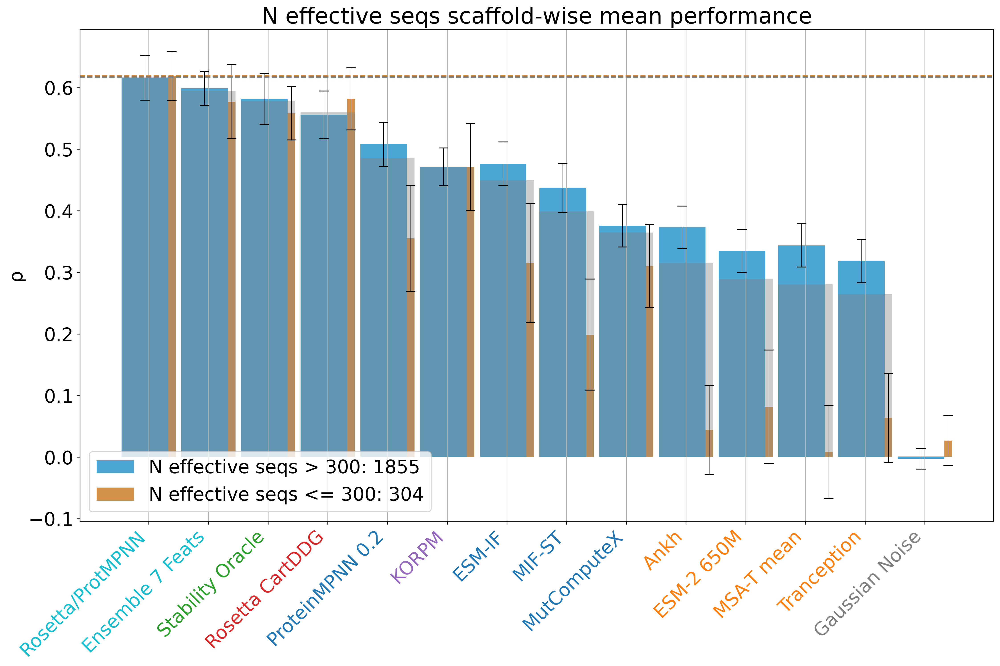

In [ ]:
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        #split_col_2 = 'conservation', 
                        threshold_1 = 300, 
                        #threshold_2 = 80, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        order=model_order,
                        plots='top',
                        drop_label = True
                        )
# < 10 seconds

  0%|          | 0/1000 [00:00<?, ?it/s]

540.25
547.25
['ddG_dir', 'mpnn_rosetta_dir', 'K1566_pslm_rfa_7_dir', 'stability-oracle_dir', 'cartesian_ddg_dir', 'mpnn_20_00_dir', 'korpm_dir', 'esmif_multimer_dir', 'mifst_dir', 'mutcomputex_dir', 'ankh_dir', 'esm2_650M_dir', 'msa_transformer_mean_dir', 'tranception_weights_dir', 'random_dir']
class
delta_kdh <= 0 & rel_ASA <= 0.2    593
delta_kdh <= 0 & rel_ASA > 0.2     434
delta_kdh > 0 & rel_ASA <= 0.2     432
delta_kdh > 0 & rel_ASA > 0.2      702
Name: n, dtype: int64


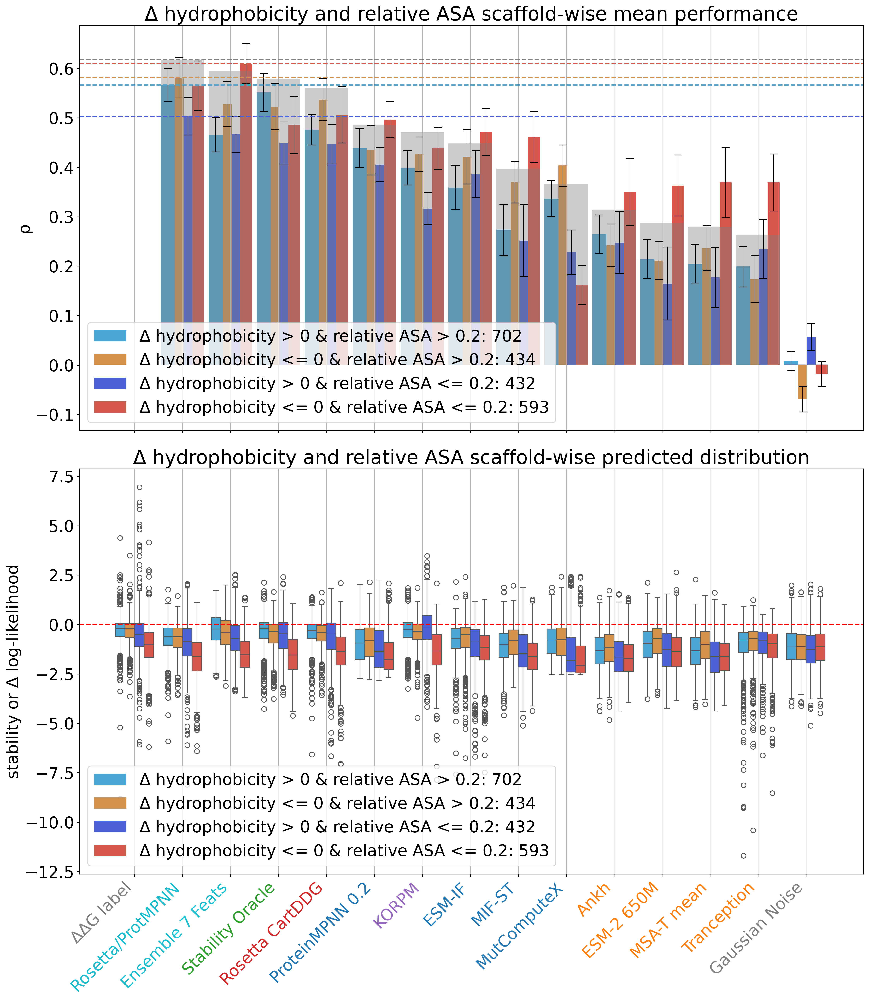

In [ ]:
current_feats = ['delta_kdh_dir', 'rel_ASA_dir', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)
#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        )
# < 10 seconds

### Generating the pairwise ensembles used in the model complementarity section

In [ ]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]
#models += ['mpnn_mean_dir', 'esmif_mean_dir', 'esm2_mean_dir', 'mif_mean_dir']

#db_summ = db_preds.join(db_ddg).join(db_cluster)
#db_summ = db_class
#db_summ['ddG_dir'] = db_summ['ddG']
#db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db[models + ['cluster', 'ddG']] #db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0
dfr['runtime_mutcomputex_dir'] = np.nan
dfr['runtime_stability-oracle_dir'] = np.nan

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))
dfm

# < 10 seconds

concatenating
joining...


,,esmif_monomer_dir,msa_transformer_median_dir,msa_transformer_mean_dir,mutcomputex_dir,stability-oracle_dir,esm2_3B_dir,esm2_15B_half_dir,esmif_multimer_dir,mpnn_10_00_dir,mpnn_20_00_dir,...,runtime_delta_chg_dir + cartesian_ddg_dir * 0.2,runtime_delta_chg_dir + rel_ASA_dir * 1,runtime_delta_chg_dir + rel_ASA_dir * 0.5,runtime_delta_chg_dir + rel_ASA_dir * 0.2,runtime_delta_chg_dir + delta_kdh_dir * 1,runtime_delta_chg_dir + delta_kdh_dir * 0.5,runtime_delta_chg_dir + delta_kdh_dir * 0.2,runtime_delta_chg_dir + delta_vol_dir * 1,runtime_delta_chg_dir + delta_vol_dir * 0.5,runtime_delta_chg_dir + delta_vol_dir * 0.2
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,-0.043712,-8.570910,-8.462356,-0.010359,-0.420,-11.571676,-11.668701,-0.043713,1.969108,2.077375,...,5,0,0,0,0,0,0,0,0,0
1A23_32L,1A23_32L,-0.042389,-7.639166,-7.748131,0.383801,0.528,-13.755667,-13.076172,-0.042389,-0.021528,2.326742,...,6,0,0,0,0,0,0,0,0,0
1A23_32S,1A23_32S,-0.029983,-5.161361,-5.346782,-0.003409,-0.170,-8.291791,-10.436035,-0.029983,0.243430,0.858738,...,6,0,0,0,0,0,0,0,0,0
1A23_32Y,1A23_32Y,-0.020219,-4.510036,-4.245017,0.060203,0.732,-8.121881,-9.415039,-0.020220,-0.115764,0.649091,...,6,0,0,0,0,0,0,0,0,0
1A23_33S,1A23_33S,-0.024960,-7.309464,-7.304522,-0.327936,-1.156,-12.002896,-12.722168,-0.024960,1.373216,-0.305126,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.037373,-0.298061,-0.834436,0.002285,0.628,-3.150103,-2.374512,-0.038054,0.082326,0.305977,...,6,0,0,0,0,0,0,0,0,0
5CRO_26Q,5CRO_26Q,-0.004605,1.459888,0.721684,0.013478,0.921,-2.508844,-2.625244,-0.006247,1.808440,1.264375,...,6,0,0,0,0,0,0,0,0,0
5CRO_26V,5CRO_26V,0.037691,0.751292,-0.029315,0.043387,0.513,-3.204980,-2.228027,0.032355,1.397881,0.928658,...,6,0,0,0,0,0,0,0,0,0


In [ ]:
series = dfm.reset_index()['uid'].duplicated(keep=False)
dfm.reset_index()['uid'][series]

Series([], Name: uid, dtype: object)

### Function to retrieve all the pairwise predictions (precalculated for this demo)

In [ ]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

### Pairwise statistics for all model combinations

In [ ]:
# compute all statistics on the combined set (already done, takes ~12 hours)
d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv'), overwrite=True)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1976 [00:00<?, ?it/s]

auroc  \
model_type  model                                          class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.783691   
            mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN    0.777436   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN    0.777436   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN    0.779256   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN    0.792048   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 0.5       NaN    0.783507   
transfer    stability-oracle_dir + mpnn_20_00_dir * 1      NaN    0.785490   
            mpnn_20_00_dir + stability-oracle_dir * 1      NaN    0.785490   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 1         NaN    0.776392   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.776392   
            mpnn_30_00_dir + cartesian_ddg_dir * 1         NaN    0.771404   
            cartesian_ddg_dir + mpnn_30_00_dir * 1         NaN    0.771404   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.2       NaN    0.777314   
transfer    stability-oracle_dir + mpnn_10_00_dir * 1      NaN    0.782551   
            mpnn_10_00_dir + stability-oracle_dir * 1      NaN    0.782551   
            stability-oracle_dir + mpnn_20_00_dir * 0.5    NaN    0.793441   
            stability-oracle_dir + mpnn_30_00_dir * 0.5    NaN    0.790866   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.791328   
            stability-oracle_dir + cartesian_ddg_dir * 1   NaN    0.796168   
            cartesian_ddg_dir + stability-oracle_dir * 1   NaN    0.796168   

                                                                     auprc  \
model_type  model                                          class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.530218   
            mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN    0.525606   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN    0.525606   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN    0.523187   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN    0.524390   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 0.5       NaN    0.532083   
transfer    stability-oracle_dir + mpnn_20_00_dir * 1      NaN    0.519869   
            mpnn_20_00_dir + stability-oracle_dir * 1      NaN    0.519869   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 1         NaN    0.525923   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.525923   
            mpnn_30_00_dir + cartesian_ddg_dir * 1         NaN    0.519660   
            cartesian_ddg_dir + mpnn_30_00_dir * 1         NaN    0.519660   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.2       NaN    0.514754   
transfer    stability-oracle_dir + mpnn_10_00_dir * 1      NaN    0.522305   
            mpnn_10_00_dir + stability-oracle_dir * 1      NaN    0.522305   
            stability-oracle_dir + mpnn_20_00_dir * 0.5    NaN    0.523954   
            stability-oracle_dir + mpnn_30_00_dir * 0.5    NaN    0.521065   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.522532   
            stability-oracle_dir + cartesian_ddg_dir * 1   NaN    0.529939   
            cartesian_ddg_dir + stability-oracle_dir * 1   NaN    0.529939   

                                                                  0.0_n_stable  \
model_type  model                                          class                 
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN           761.0   
            mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN           761.0   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN           761.0   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN           761.0   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN           752.0   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 0.5       Na

### Supplementary Figure 7

3421


  0%|          | 0/5 [00:00<?, ?it/s]

0.092794462693441
['Stability Oracle', 'Rosetta CartDDG', 'ProteinMPNN 0.2', 'MIF', 'KORPM', 'ESM-IF', 'MIF-ST', 'MutComputeX', 'Ankh', 'MSA-T mean', 'Tranception (reduced)', 'ESM-1V mean']


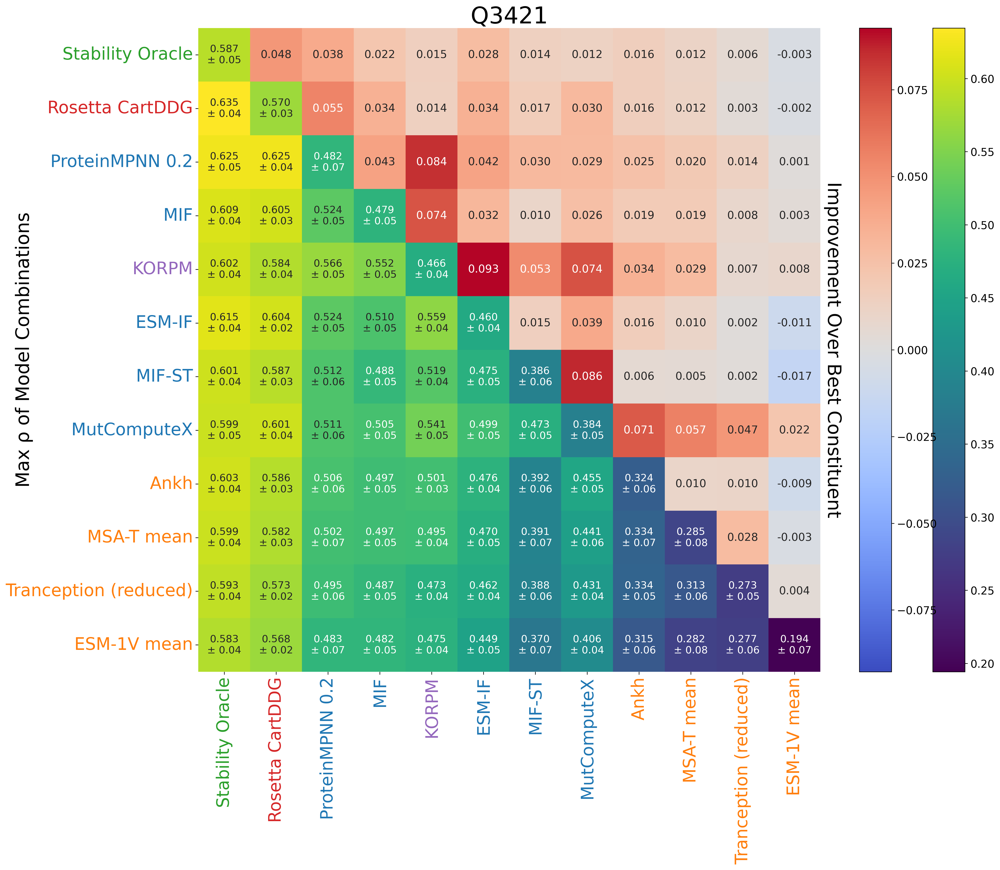

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,1,0.634576,0.001341
2,cartesian_ddg_dir,1,stability-oracle_dir,0.5,0.628626,0.006539
3,stability-oracle_dir,1,cartesian_ddg_dir,0.5,0.628031,0.000483
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,0.625274,0.001722
5,stability-oracle_dir,1,mpnn_20_00_dir,0.5,0.625002,0.002555
...,...,...,...,...,...,...
326,esm1v_mean_dir,1,mifst_dir,0.2,0.241405,0.000445
327,esm1v_mean_dir,1,tranception_dir,0.5,0.234164,0.033456
328,esm1v_mean_dir,1,ankh_dir,0.2,0.230795,0.001096


In [ ]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'ankh_dir',
            'esm2_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2, title='Q3421')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df

### Extra Figure (not in text) showing Net Stabilization instead

3421


  0%|          | 0/5 [00:00<?, ?it/s]

138.568
['Rosetta CartDDG', 'ProteinMPNN 0.2', 'ESM-IF', 'Stability Oracle', 'MutComputeX', 'Tranception (reduced)', 'Ankh', 'MIF', 'MIF-ST', 'MSA-T mean', 'KORPM', 'ESM-1V mean']


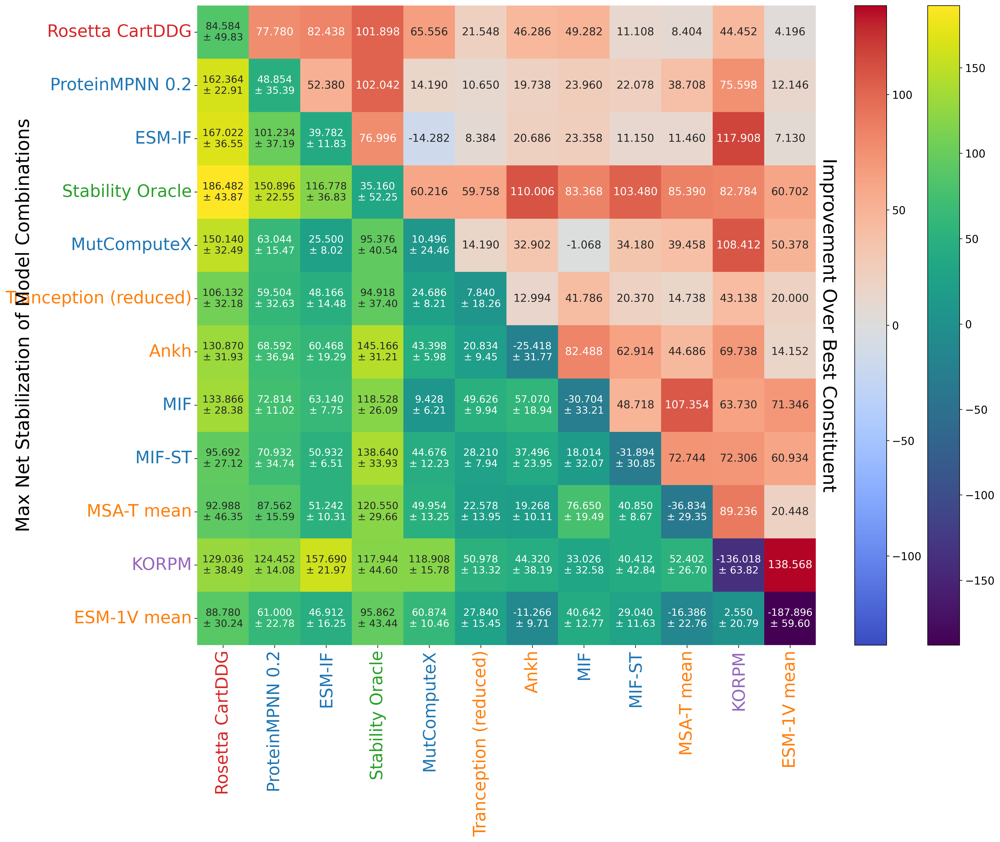

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,0.5,186.482,0.003108
2,cartesian_ddg_dir,1,esmif_multimer_dir,0.5,167.022,0.001917
3,cartesian_ddg_dir,1,esmif_multimer_dir,0.2,162.592,0.003415
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,162.364,0.004642
5,stability-oracle_dir,1,cartesian_ddg_dir,1,160.774,0.005988
...,...,...,...,...,...,...
326,esm1v_mean_dir,1,msa_transformer_mean_dir,0.2,-70.45,0.136866
327,korpm_dir,1,esm1v_mean_dir,0.2,-73.658,0.004942
328,esm1v_mean_dir,1,mifst_dir,0.2,-77.794,0.04527


In [ ]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df

# ~ 10 seconds

### Supplementary Figure 8

0.0013924680652412


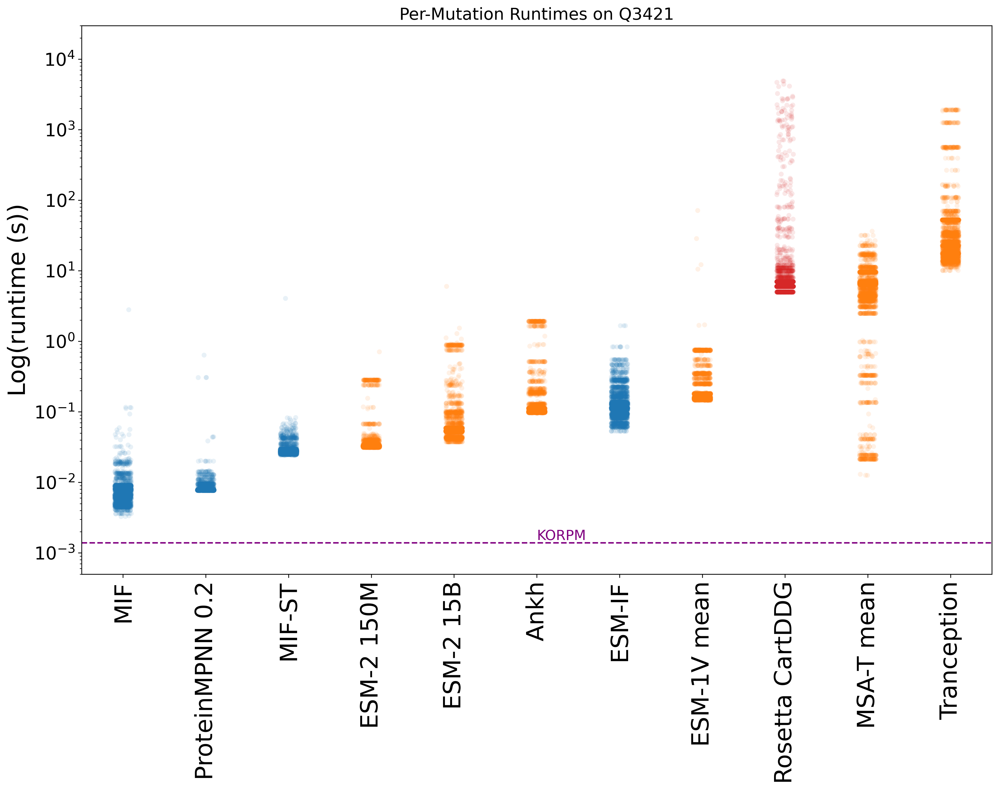

In [ ]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_weights_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir',
                             'runtime_korpm_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])
korpm_time = total_runtimes.loc[total_runtimes['variable']=='korpm', 'value'].mean()
print(korpm_time)
total_runtimes = total_runtimes.loc[total_runtimes['variable']!='korpm']

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=korpm_time, color='purple', linestyle='--', label='KORPM')
plt.text(5, korpm_time, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on Q3421')
plt.yscale('log')
plt.ylim(0.0005, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

### Following cells relate to preprocessing required for Supplementary Figure 2

### Supplementary Figure 2

[ 5.59485531e-01  5.00000000e-01  4.67018470e-01  0.00000000e+00
 -9.03538256e-06  0.00000000e+00 -5.43614752e-04]


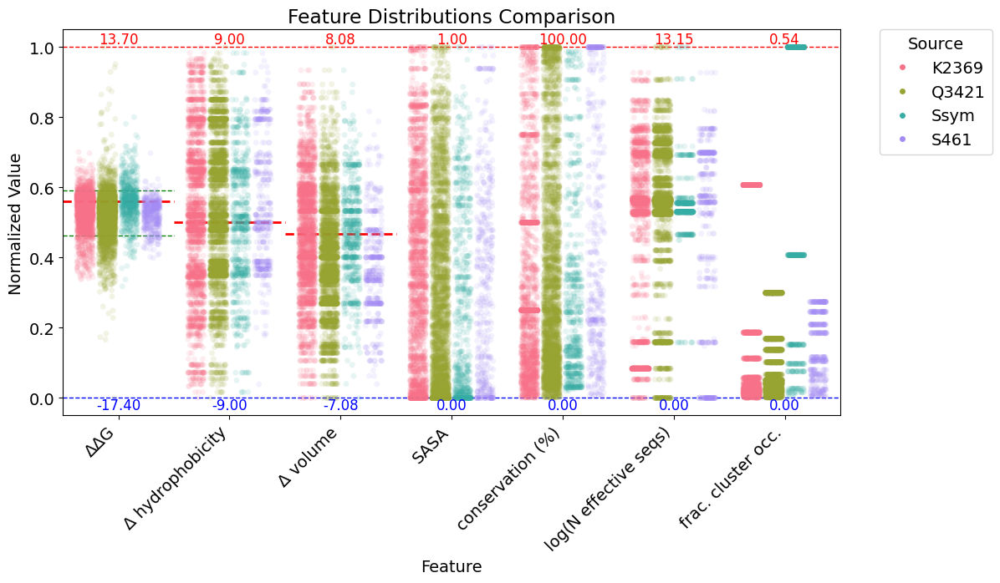

In [ ]:
import importlib
importlib.reload(analysis_utils)

#db = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))
s461_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))
ssym_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))
ssym_feats = ssym_feats.rename({'delta_kdh':'delta_kdh_dir', 'delta_vol':'delta_vol_dir', 'rel_ASA':'rel_ASA_dir'}, axis=1)
korpm_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k2369_analysis.csv'))

#compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])
analysis_utils.compare_distributions_boxes([korpm_feats,db,ssym_feats,s461_feats], shared_columns=['ddG', 'delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff'], sources=['K2369', 'Q3421', 'Ssym', 'S461'])
#analysis_utils.compare_distributions_violin(db, korpm_feats, shared_columns=['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff', 'ddG'], source1='Q3421', label_adjust=0.25)

### Figure 5 (Methods)

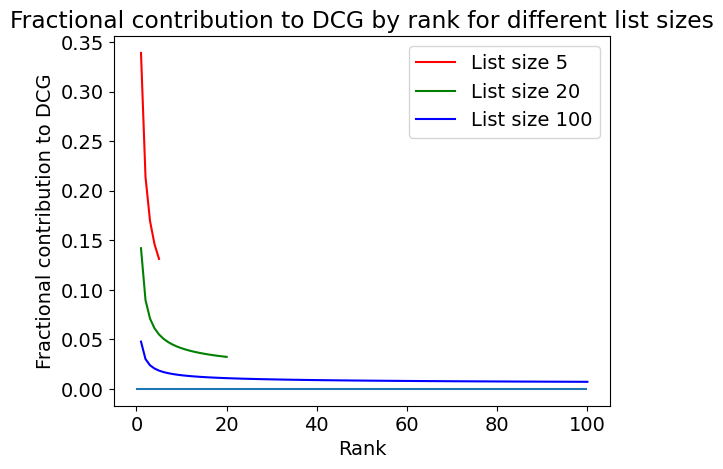

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()